# NAME: ANSH PUJARA
# ASSIGNMENT DAY 21
# AI - ML BATCH 1

## Importing libraries

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Linear Regression

## Importing data

In [2]:
data = pd.read_excel("mullinreg.xlsx")
data.head()

,price,sqft_living,bedrooms,bathrooms,floors
0,221900,1180,3,1.00,1.0
1,538000,2570,3,2.25,2.0
2,180000,770,2,1.00,1.0
3,604000,1960,4,3.00,1.0
4,510000,1680,3,2.00,1.0


## Analysing data

In [3]:
data.dtypes

price            int64
sqft_living      int64
bedrooms         int64
bathrooms      float64
floors         float64
dtype: object

In [4]:
data.describe()

,price,sqft_living,bedrooms,bathrooms,floors
count,2.161300e+04,21613.000000,21613.000000,21613.000000,21613.000000
mean,5.400881e+05,2079.899736,3.370842,2.114757,1.494309
std,3.671272e+05,918.440897,0.930062,0.770163,0.539989
min,7.500000e+04,290.000000,0.000000,0.000000,1.000000
25%,3.219500e+05,1427.000000,3.000000,1.750000,1.000000
50%,4.500000e+05,1910.000000,3.000000,2.250000,1.500000
75%,6.450000e+05,2550.000000,4.000000,2.500000,2.000000
max,7.700000e+06,13540.000000,33.000000,8.000000,3.500000


In [5]:
data.isna().any()

price          False
sqft_living    False
bedrooms       False
bathrooms      False
floors         False
dtype: bool

In [6]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21613 entries, 0 to 21612
Data columns (total 5 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   price        21613 non-null  int64  
 1   sqft_living  21613 non-null  int64  
 2   bedrooms     21613 non-null  int64  
 3   bathrooms    21613 non-null  float64
 4   floors       21613 non-null  float64
dtypes: float64(2), int64(3)
memory usage: 844.4 KB


array([[<AxesSubplot:title={'center':'price'}>,
        <AxesSubplot:title={'center':'sqft_living'}>],
       [<AxesSubplot:title={'center':'bedrooms'}>,
        <AxesSubplot:title={'center':'bathrooms'}>],
       [<AxesSubplot:title={'center':'floors'}>, <AxesSubplot:>]],
      dtype=object)

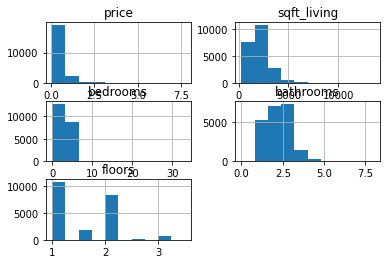

In [7]:
data.hist()

In [8]:
from pandas_profiling import ProfileReport

In [9]:
ProfileReport(data)

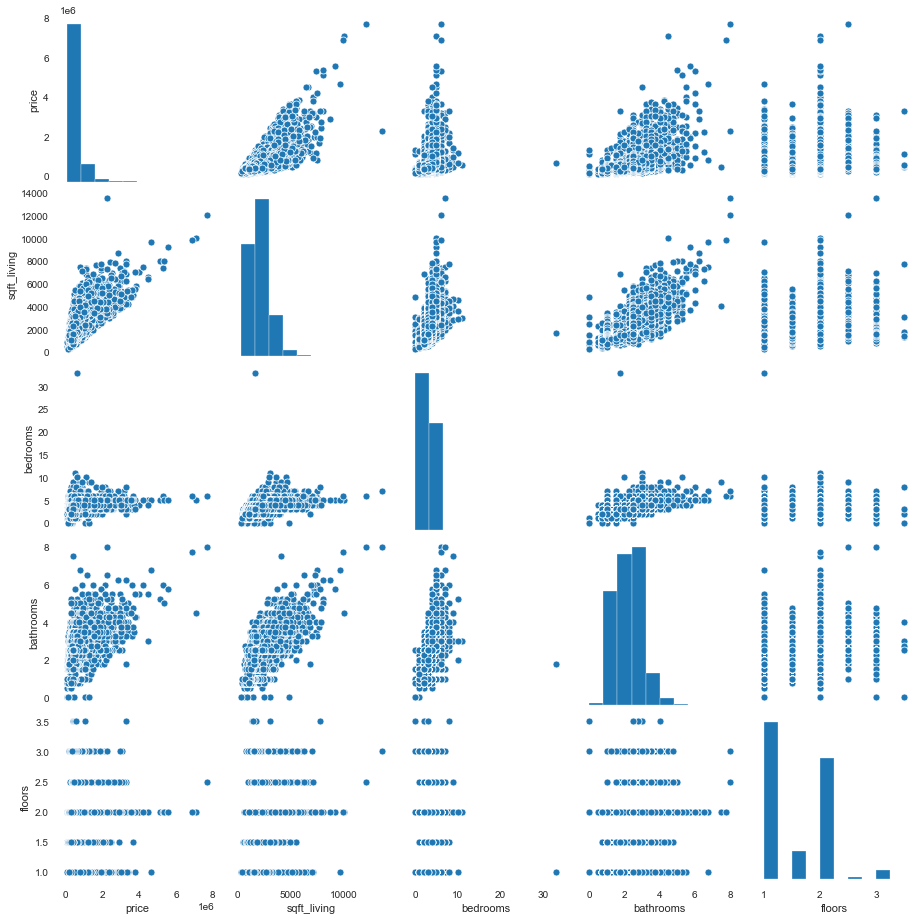

In [10]:
sns.pairplot(data)

<AxesSubplot:>

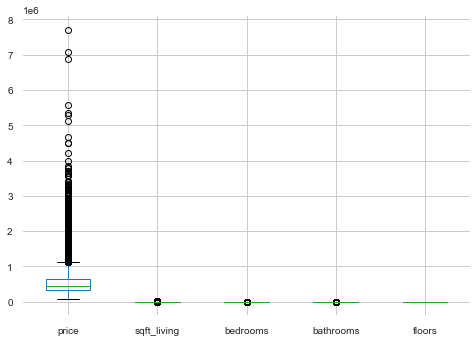

In [11]:
data.boxplot()

In [16]:
y = data['price']
x = data[['sqft_living', 'bedrooms', 'bathrooms', 'floors']]

## Standardising the data

In [17]:
from sklearn.preprocessing import StandardScaler
sc = StandardScaler()

In [18]:
x = sc.fit_transform(x)

In [14]:
data1

array([[-0.86671733, -0.97983502, -0.39873715, -1.44746357, -0.915427  ],
       [-0.00568792,  0.53363434, -0.39873715,  0.1756067 ,  0.93650577],
       [-0.98084935, -1.42625404, -1.47395936, -1.44746357, -0.915427  ],
       ...,
       [-0.37586519, -1.15404732, -1.47395936, -1.77207762,  0.93650577],
       [-0.38158814, -0.52252773, -0.39873715,  0.50022075,  0.93650577],
       [-0.58588173, -1.15404732, -1.47395936, -1.77207762,  0.93650577]])

## Splitting into train and test

In [19]:
from sklearn.model_selection import train_test_split
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size = 0.2, random_state = 320)

In [20]:
print(x_train.shape)
print(x_test.shape)
print(y_train.shape)
print(y_test.shape)

(17290, 4)
(4323, 4)
(17290,)
(4323,)


## Training the model

In [21]:
from sklearn.linear_model import LinearRegression

In [22]:
model = LinearRegression(normalize=True)

In [23]:
model.fit(x_train, y_train)

LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=True)

## Testing the model

In [25]:
y_pred = model.predict(x_test)
y_pred

array([286887.88278332, 735481.73561138, 492630.24382308, ...,
       496643.66625948, 348396.54756522, 252359.5288004 ])

## Evaluation of model

In [26]:
from sklearn.metrics import r2_score, mean_squared_error

In [27]:
print("R2 value is: ", r2_score(y_test, y_pred))
print("RMSE value is: ", np.sqrt(mean_squared_error(y_test, y_pred)))

R2 value is:  0.502851674135032
RMSE value is:  269870.3096200268


# Logistic Regression

In [28]:
data = pd.read_csv("general_data.csv")

In [29]:
data.head()

,Age,Attrition,BusinessTravel,Department,DistanceFromHome,Education,EducationField,EmployeeCount,EmployeeID,Gender,...,NumCompaniesWorked,Over18,PercentSalaryHike,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,YearsAtCompany,YearsSinceLastPromotion,YearsWithCurrManager
0,51,No,Travel_Rarely,Sales,6,2,Life Sciences,1,1,Female,...,1.0,Y,11,8,0,1.0,6,1,0,0
1,31,Yes,Travel_Frequently,Research & Development,10,1,Life Sciences,1,2,Female,...,0.0,Y,23,8,1,6.0,3,5,1,4
2,32,No,Travel_Frequently,Research & Development,17,4,Other,1,3,Male,...,1.0,Y,15,8,3,5.0,2,5,0,3
3,38,No,Non-Travel,Research & Development,2,5,Life Sciences,1,4,Male,...,3.0,Y,11,8,3,13.0,5,8,7,5
4,32,No,Travel_Rarely,Research & Development,10,1,Medical,1,5,Male,...,4.0,Y,12,8,2,9.0,2,6,0,4


In [30]:
data.isna().sum()

Age                         0
Attrition                   0
BusinessTravel              0
Department                  0
DistanceFromHome            0
Education                   0
EducationField              0
EmployeeCount               0
EmployeeID                  0
Gender                      0
JobLevel                    0
JobRole                     0
MaritalStatus               0
MonthlyIncome               0
NumCompaniesWorked         19
Over18                      0
PercentSalaryHike           0
StandardHours               0
StockOptionLevel            0
TotalWorkingYears           9
TrainingTimesLastYear       0
YearsAtCompany              0
YearsSinceLastPromotion     0
YearsWithCurrManager        0
dtype: int64

In [65]:
data = data.dropna()

In [31]:
data.describe().T

,count,mean,std,min,25%,50%,75%,max
Age,4410.0,36.923810,9.133301,18.0,30.00,36.0,43.00,60.0
DistanceFromHome,4410.0,9.192517,8.105026,1.0,2.00,7.0,14.00,29.0
Education,4410.0,2.912925,1.023933,1.0,2.00,3.0,4.00,5.0
EmployeeCount,4410.0,1.000000,0.000000,1.0,1.00,1.0,1.00,1.0
EmployeeID,4410.0,2205.500000,1273.201673,1.0,1103.25,2205.5,3307.75,4410.0
JobLevel,4410.0,2.063946,1.106689,1.0,1.00,2.0,3.00,5.0
MonthlyIncome,4410.0,65029.312925,47068.888559,10090.0,29110.00,49190.0,83800.00,199990.0
NumCompaniesWorked,4391.0,2.694830,2.498887,0.0,1.00,2.0,4.00,9.0
PercentSalaryHike,4410.0,15.209524,3.659108,11.0,12.00,14.0,18.00,25.0
StandardHours,4410.0,8.000000,0.000000,8.0,8.00,8.0,8.00,8.0


In [32]:
ProfileReport(data)

In [33]:
import statsmodels.api as sm

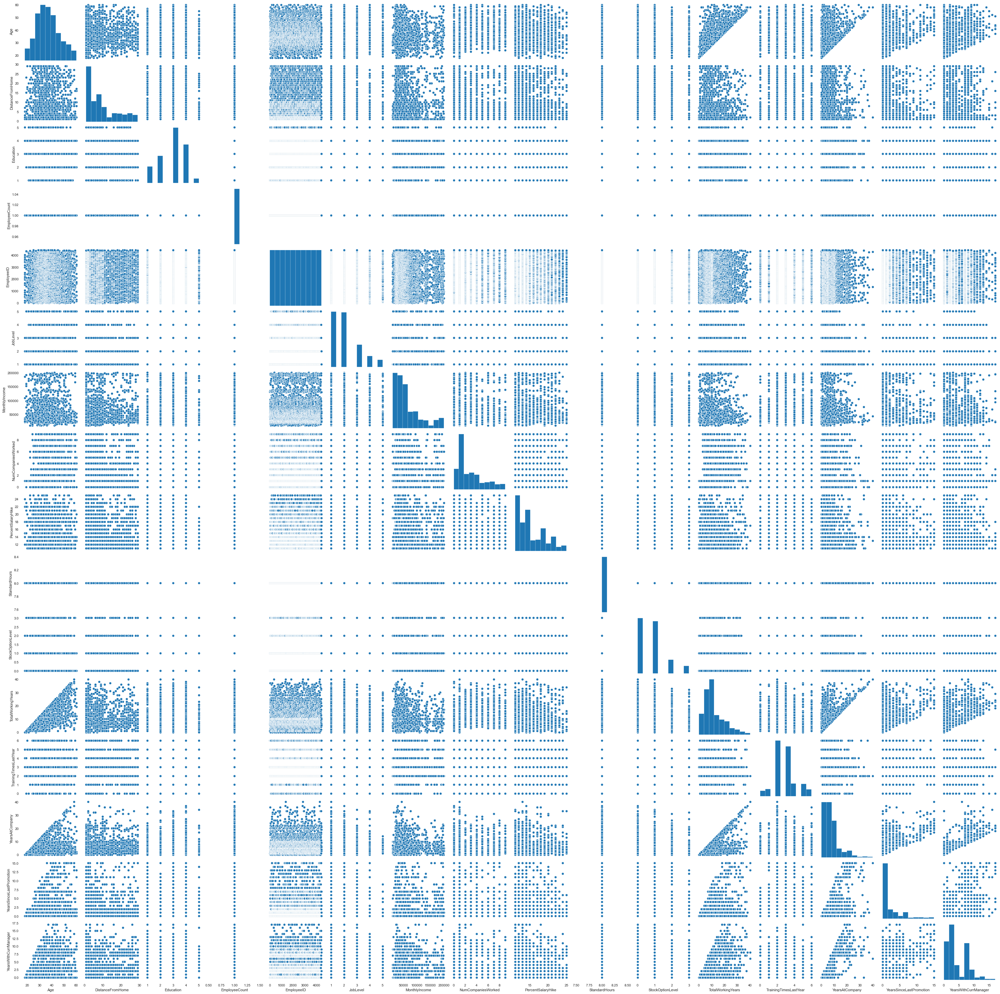

In [34]:
sns.pairplot(data)

In [35]:
data = data.drop('EmployeeID', axis=1)

In [36]:
data.columns

Index(['Age', 'Attrition', 'BusinessTravel', 'Department', 'DistanceFromHome',
       'Education', 'EducationField', 'EmployeeCount', 'Gender', 'JobLevel',
       'JobRole', 'MaritalStatus', 'MonthlyIncome', 'NumCompaniesWorked',
       'Over18', 'PercentSalaryHike', 'StandardHours', 'StockOptionLevel',
       'TotalWorkingYears', 'TrainingTimesLastYear', 'YearsAtCompany',
       'YearsSinceLastPromotion', 'YearsWithCurrManager'],
      dtype='object')

In [66]:
y = data['Attrition']
col = [x for x in data.columns if x != 'Attrition']

In [67]:
x = data[col]

In [68]:
from sklearn.preprocessing import LabelEncoder

In [69]:
encoder = LabelEncoder()

In [70]:
x = pd.get_dummies(x)

In [71]:
x1 = sm.add_constant(x)

In [72]:
x1

,Age,DistanceFromHome,Education,EmployeeCount,JobLevel,MonthlyIncome,NumCompaniesWorked,PercentSalaryHike,StandardHours,StockOptionLevel,...,JobRole_Manager,JobRole_Manufacturing Director,JobRole_Research Director,JobRole_Research Scientist,JobRole_Sales Executive,JobRole_Sales Representative,MaritalStatus_Divorced,MaritalStatus_Married,MaritalStatus_Single,Over18_Y
0,51,6,2,1,1,131160,1.0,11,8,0,...,0,0,0,0,0,0,0,1,0,1
1,31,10,1,1,1,41890,0.0,23,8,1,...,0,0,0,1,0,0,0,0,1,1
2,32,17,4,1,4,193280,1.0,15,8,3,...,0,0,0,0,1,0,0,1,0,1
3,38,2,5,1,3,83210,3.0,11,8,3,...,0,0,0,0,0,0,0,1,0,1
4,32,10,1,1,1,23420,4.0,12,8,2,...,0,0,0,0,1,0,0,0,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4404,29,4,3,1,2,35390,1.0,18,8,0,...,0,0,0,0,0,0,0,0,1,1
4405,42,5,4,1,1,60290,3.0,17,8,1,...,0,0,0,1,0,0,0,0,1,1
4406,29,2,4,1,1,26790,2.0,15,8,0,...,0,0,0,0,0,0,1,0,0,1
4407,25,25,2,1,2,37020,0.0,20,8,0,...,0,0,0,0,1,0,0,1,0,1


In [73]:
y1 = y.map({'No':0, 'Yes':1})
y1

0       0
1       1
2       0
3       0
4       0
       ..
4404    0
4405    0
4406    0
4407    0
4408    0
Name: Attrition, Length: 4382, dtype: int64

In [77]:
from sklearn.model_selection import train_test_split
x_train, x_test, y_train, y_test = train_test_split(x1, y1, test_size = 0.2, random_state = 320)

In [78]:
Logistic = sm.Logit(y_train, x_train)
result = Logistic.fit()

Optimization terminated successfully.
         Current function value: 0.382392
         Iterations 29


In [83]:
result.summary2()

<class 'statsmodels.iolib.summary2.Summary'>
"""
                                         Results: Logit
================================================================================================
Model:                         Logit                      Pseudo R-squared:           0.147     
Dependent Variable:            Attrition                  AIC:                        2748.5644 
Date:                          2020-08-21 16:09           BIC:                        2958.0706 
No. Observations:              3505                       Log-Likelihood:             -1340.3   
Df Model:                      33                         LL-Null:                    -1570.9   
Df Residuals:                  3471                       LLR p-value:                6.2259e-77
Converged:                     1.0000                     Scale:                      1.0000    
No. Iterations:                29.0000                                                          
------------------------------------------------------------------------------------------------
                                   Coef.    Std.Err.      z    P>|z|      [0.025       0.975]   
------------------------------------------------------------------------------------------------
Age                               -0.0306       0.0077 -3.9788 0.0001       -0.0457      -0.0155
DistanceFromHome                  -0.0053       0.0063 -0.8491 0.3958       -0.0176       0.0070
Education                         -0.1029       0.0489 -2.1051 0.0353       -0.1987      -0.0071
EmployeeCount                      0.1256          nan     nan    nan           nan          nan
JobLevel                          -0.0326       0.0452 -0.7217 0.4705       -0.1213       0.0560
MonthlyIncome                     -0.0000       0.0000 -1.2935 0.1958       -0.0000       0.0000
NumCompaniesWorked                 0.1422       0.0215  6.6197 0.0000        0.1001       0.1843
PercentSalaryHike                  0.0173       0.0135  1.2814 0.2000       -0.0092       0.0438
StandardHours                      0.0300          nan     nan    nan           nan          nan
StockOptionLevel                  -0.0928       0.0596 -1.5569 0.1195       -0.2095       0.0240
TotalWorkingYears                 -0.0671       0.0136 -4.9323 0.0000       -0.0938      -0.0405
TrainingTimesLastYear             -0.1449       0.0406 -3.5684 0.0004       -0.2245      -0.0653
YearsAtCompany                     0.0143       0.0210  0.6829 0.4947       -0.0268       0.0554
YearsSinceLastPromotion            0.1529       0.0229  6.6739 0.0000        0.1080       0.1978
YearsWithCurrManager              -0.1306       0.0253 -5.1651 0.0000       -0.1802      -0.0810
BusinessTravel_Non-Travel         -0.8678          nan     nan    nan           nan          nan
BusinessTravel_Travel_Frequently   0.8103          nan     nan    nan           nan          nan
BusinessTravel_Travel_Rarely       0.0632          nan     nan    nan           nan          nan
Department_Human Resources         0.5275          nan     nan    nan           nan          nan
Department_Research & Development -0.1825          nan     nan    nan           nan          nan
Department_Sales                  -0.3394          nan     nan    nan           nan          nan
EducationField_Human Resources     0.3290          nan     nan    nan           nan          nan
EducationField_Life Sciences       0.0690          nan     nan    nan           nan          nan
EducationField_Marketing           0.0591          nan     nan    nan           nan          nan
EducationField_Medical            -0.0656          nan     nan    nan           nan          nan
EducationField_Other              -0.1539          nan     nan    nan           nan          nan
EducationField_Technical Degree   -0.2319          nan     nan    nan           nan          nan
Gender_Female                     -0.0796          nan     nan    nan           nan          nan
Gender_Male    